In [2]:
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split, KFold
from tensorflow.keras import models, layers, regularizers
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.metrics import classification_report
from tensorflow.keras.applications import MobileNetV2
import kerastuner as kt
from tensorflow.keras.optimizers.schedules import ExponentialDecay


https://www.kaggle.com/datasets/marquis03/plants-classification/data

In [3]:
gpus = tf.config.experimental.list_physical_devices('GPU')
print(gpus)

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# Data set glossary

The dataset contains **30 types** of plants images, including **21000 training** images, **3000 validation** images and **6000 test** images, with a total data size of **1.48GB**, and supports the recognition of the following plants types: **aloevera**, **banana**, **bilimbi**, **cantaloupe**, **cassava**, **coconut**, **corn**, **cucumber**, **curcuma**, **eggplant**, **galangal**, **ginger**, **guava**, **kale**, **longbeans**, **mango**, **melon**, **orange**, **paddy**, **papaya**, **peperchili**, **pineapple**, **pomelo**, **shallot**, **soybeans**, **spinach**, **sweetpotatoes**, **tobacco**, **waterapple**, and **watermelon**.

## Constants

In [10]:
IMG_SIZE = (96, 96)
BATCH_SIZE = 256
AUTO = tf.data.AUTOTUNE
SEED = 10
LIST_SEED = [12, 23, 34, 42, 56, 68, 75, 82, 95, 111]
PATH_DATA = 'C:\\Prog\\home_work\\data\\plants_data\\'

# EDA & Preparing the dataset

In [11]:
# Class labels
classes = {
    0: 'aloevera', 1: 'banana', 2: 'bilimbi', 3: 'cantaloupe', 4: 'cassava', 5: 'coconut',
    6: 'corn', 7: 'cucumber', 8: 'curcuma', 9: 'eggplant', 10: 'galangal', 11: 'ginger',
    12: 'guava', 13: 'kale', 14: 'longbeans', 15: 'mango', 16: 'melon', 17: 'orange',
    18: 'paddy', 19: 'papaya', 20: 'peperchili', 21: 'pineapple', 22: 'pomelo', 23: 'shallot',
    24: 'soybeans', 25: 'spinach', 26: 'sweetpotatoes', 27: 'tobacco', 28: 'waterapple', 29: 'watermelon'
}

# Load data
def load_and_preprocess_data(file_path):
    data = pd.read_csv(file_path)
    data = shuffle(data).reset_index(drop=True)
    data['full_link'] = PATH_DATA + data['image:FILE']
    return data

train_data = load_and_preprocess_data(PATH_DATA + 'train.csv')
valid_data = load_and_preprocess_data(PATH_DATA + 'val.csv')
test_data = load_and_preprocess_data(PATH_DATA + 'test.csv')


print("train images: ", train_data.shape[0])
print("validation images: ", valid_data.shape[0])
print("test images: ", test_data.shape[0])

train images:  21000
validation images:  3000
test images:  6000


In [12]:
def get_folder_counts(data):
    unique_folders = data['image:FILE'].apply(lambda x: x.split('/')[1])
    folder_counts = unique_folders.value_counts()
    return folder_counts

In [13]:
# Get folder counts for each dataset
train_folder_counts = get_folder_counts(train_data)
valid_folder_counts = get_folder_counts(valid_data)
test_folder_counts = get_folder_counts(test_data)

In [14]:
# Combine results into a DataFrame
folder_counts_df = pd.DataFrame({
    'Train Dataset': train_folder_counts,
    'Validation Dataset': valid_folder_counts,
    'Test Dataset': test_folder_counts
}).fillna(0).astype(int)  

# Display the results
folder_counts_df

,Train Dataset,Validation Dataset,Test Dataset
image:FILE,,,
aloevera,700,100,200
banana,700,100,200
bilimbi,700,100,200
cantaloupe,700,100,200
cassava,700,100,200
coconut,700,100,200
corn,700,100,200
cucumber,700,100,200
curcuma,700,100,200


The table provides a clear overview of the distribution of images across different plant classes in the three datasets: Train, Validation, and Test. Here are some observations and conclusions based on the provided data:

1. **Consistent Dataset Sizes:**
   * Each class in every dataset (Train, Validation, and Test) contains 700 images. This suggests a consistent and balanced distribution of images across different plant classes
2. **Uniformity Across Datasets:**
   * The counts are the same for each class in all three datasets (Train, Validation, and Test). This uniformity is essential for ensuring that the model is trained on a diverse and representative set of data, and its performance can be reliably evaluated on the validation and test sets.
3. **Adequate Validation and Test Sets:**
   * The validation and test sets both have 100 images per class, providing a substantial amount of data for model evaluation. This ensures that the model is assessed on a diverse set of examples, enhancing its generalization to new, unseen data.
4. **Potential Overfitting Considerations:**
   * While the dataset appears balanced and well-distributed, it's essential to monitor the model's performance to check for overfitting. If the model performs significantly better on the training set compared to the validation and test sets, it may indicate overfitting.
5. **Model Training Considerations:**
   * The balanced distribution of images across classes in the training set is beneficial for training a model that learns to recognize various plant classes effectively. The model should be able to generalize well to unseen data if the training set is representative of the overall distribution.


**In conclusion**, the dataset structure appears well-prepared for training and evaluating a model to classify plant images into different classes. The uniformity across datasets and class distributions sets a solid foundation for building a robust and generalizable machine learning model.

# Model

In [15]:
# Data preprocessing functions
def img_preprocessing(image, label):
    img = tf.io.read_file(image)
    img = tf.io.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, size=IMG_SIZE)
    img = tf.cast(img, tf.float32) / 255.0
    return img, label

def augmentation(image, label):
    img = tf.image.random_flip_left_right(image)
    img = tf.image.random_flip_up_down(img)
    img = tf.image.random_saturation(img, lower=0.8, upper=1.2)
    img = tf.image.rot90(img, k=tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32))
    return img, label

In [16]:
def create_dataset_loader(data, batch_size, preprocessing_functions=[]):
    loader = tf.data.Dataset.from_tensor_slices((data['full_link'], data['category']))

    for func in preprocessing_functions:
        loader = loader.map(func, num_parallel_calls=AUTO)

    loader = loader.batch(batch_size).prefetch(AUTO)

    return loader

In [17]:
# Common preprocessing functions
common_preprocessing_functions = [img_preprocessing, augmentation]

# Creating datasets
train_dataset = create_dataset_loader(train_data, BATCH_SIZE, common_preprocessing_functions)
valid_dataset = create_dataset_loader(valid_data, BATCH_SIZE, [img_preprocessing])
test_dataset = create_dataset_loader(test_data, BATCH_SIZE, [img_preprocessing])

# Model 1

In [24]:
# import kerastuner as kt
# from tensorflow.keras.callbacks import EarlyStopping

# def build_model_1(hp):
#     model = models.Sequential()
    
#     model.add(layers.Conv2D(hp.Int('conv1_units', min_value=32, max_value=256, step=32), (3, 3), activation='relu', input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3)))
#     model.add(layers.MaxPooling2D((2, 2)))
    
#     model.add(layers.Conv2D(hp.Int('conv2_units', min_value=64, max_value=512, step=64), (3, 3), activation='relu'))
#     model.add(layers.MaxPooling2D((2, 2)))
    
#     model.add(layers.Conv2D(hp.Int('conv3_units', min_value=128, max_value=1024, step=128), (3, 3), activation='relu'))
#     model.add(layers.MaxPooling2D((2, 2)))
    
#     model.add(layers.Flatten())
    
#     model.add(layers.Dense(hp.Int('dense_units', min_value=256, max_value=1024, step=128), activation='relu', kernel_regularizer=regularizers.l2(hp.Float('l2_reg', min_value=1e-5, max_value=1e-1, sampling='log'))))
    
#     model.add(layers.Dropout(hp.Float('dropout_rate', min_value=0.2, max_value=0.7, step=0.1)))
    
#     model.add(layers.Dense(len(classes), activation='softmax'))

#     model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])),
#                   loss='sparse_categorical_crossentropy',
#                   metrics=['accuracy'])

#     return model

# # Define early stopping
# early_stopping = EarlyStopping(monitor='val_accuracy', patience=3, restore_best_weights=True, verbose=1)

# # Instantiate the tuner
# tuner = kt.RandomSearch(build_model_1, objective='val_accuracy', max_trials=5, directory='hyperparameter_tuning', project_name='model_1')

# # Search for the best hyperparameters
# tuner.search(train_dataset, epochs=10, validation_data=valid_dataset, callbacks=[early_stopping])

# # Get the best model
# best_model_1 = tuner.get_best_models(1)[0]

# # Display the best hyperparameters
# best_hyperparameters = tuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values
# print("Best Hyperparameters:", best_hyperparameters)

# # Evaluate the best model on the test set
# test_eval = best_model_1.evaluate(test_dataset)
# print('--' * 50)
# print('Test Loss: {0:.3f}'.format(test_eval[0]))
# print('Test Accuracy: {0:.2f} %'.format(test_eval[1] * 100))


In [18]:
model_1 = models.Sequential([
    layers.Conv2D(64, (3, 3), activation='relu', input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(640, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(896, activation='relu', kernel_regularizer=regularizers.l2(0.0001145645029913237)),
    layers.Dropout(0.3),
    layers.Dense(len(classes), activation='softmax')
])

# Compile the model
model_1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Display the updated model summary
model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 94, 94, 64)        1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 47, 47, 64)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 45, 45, 64)        36928     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 22, 22, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 20, 20, 640)       369280    
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 10, 10, 640)      0

# Model 2

In [25]:
# project_name = 'model_2_11'
# epochs = 15
# max_trials = 10

# # Define a hyperparameter search space
# def build_model_2(hp):
#     base_model = MobileNetV2(input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3), include_top=False, weights='imagenet')

#     # Freeze the pre-trained layers
#     for layer in base_model.layers:
#         layer.trainable = False

#     model = models.Sequential([
#         base_model,
#         layers.GlobalAveragePooling2D(),
#         layers.Dense(hp.Int('units_1', min_value=256, max_value=4096, step=128), activation='relu', kernel_regularizer=regularizers.l2(0.001)),
#         layers.Dropout(hp.Float('dropout_1', min_value=0.2, max_value=0.7, step=0.1)),
        
#         # # Additional dense layer
#         # layers.Dense(hp.Int('units_2', min_value=256, max_value=1024, step=64), activation='relu', kernel_regularizer=regularizers.l2(0.001)),
#         # layers.Dropout(hp.Float('dropout_2', min_value=0.2, max_value=0.7, step=0.1)),

#         # # Additional dense layer
#         # layers.Dense(hp.Int('units_3', min_value=128, max_value=512, step=64), activation='relu', kernel_regularizer=regularizers.l2(0.001)),
#         # layers.Dropout(hp.Float('dropout_3', min_value=0.2, max_value=0.7, step=0.1)),
        
#         layers.Dense(len(classes), activation='softmax')
#     ])

#     model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=hp.Choice('learning_rate', values=[1e-3, 5e-4, 1e-4])),
#                   loss='sparse_categorical_crossentropy',
#                   metrics=['accuracy'])
    
#     return model

# # Instantiate the tuner
# tuner_with_layers = kt.RandomSearch(build_model_2, objective='val_accuracy', max_trials=max_trials, directory='hyperparameter_tuning', project_name=project_name)

# # Search for the best hyperparameters
# tuner_with_layers.search(train_dataset, epochs=epochs, validation_data=valid_dataset)

# # Get the best model
# best_model_with_layers = tuner_with_layers.get_best_models(1)[0]

# # Display the best hyperparameters
# best_hyperparameters_with_layers = tuner_with_layers.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values
# print("Best Hyperparameters:", best_hyperparameters_with_layers)

# # Reset the tuner by creating a new instance
# tuner_with_layers = kt.RandomSearch(build_model_2, objective='val_accuracy', max_trials=max_trials, directory='hyperparameter_tuning', project_name=project_name)

# # Search for the hyperparameters again
# tuner_with_layers.search(train_dataset, epochs=epochs, validation_data=valid_dataset)

# # Get the new best model
# best_model_with_layers_reset = tuner_with_layers.get_best_models(1)[0]

# # Display the new best hyperparameters
# best_hyperparameters_with_layers_reset = tuner_with_layers.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values
# print("New Best Hyperparameters:", best_hyperparameters_with_layers_reset)

# # Evaluate the new best model on the test set
# test_eval_with_layers_reset = best_model_with_layers_reset.evaluate(test_dataset)
# print('--' * 50)
# print('Test Loss: {0:.3f}'.format(test_eval_with_layers_reset[0]))
# print('Test Accuracy: {0:.2f} %'.format(test_eval_with_layers_reset[1] * 100))


In [19]:
# Load pre-trained MobileNetV2 model with ImageNet weights
base_model = MobileNetV2(input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3), include_top=False, weights='imagenet')

# Freeze the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Create a new model by adding custom layers on top of the pre-trained base
model_2 = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(3456, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    layers.Dropout(0.4),
    # layers.Dense(448, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    # layers.Dropout(0.2),

    # # Additional dense layer
    # layers.Dense(320, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    # layers.Dropout(0.4),
    
    layers.Dense(len(classes), activation='softmax')
])

# Compile the model
model_2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Display the updated model summary
model_2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_96 (Functi  (None, 3, 3, 1280)       2257984   
 onal)                                                           
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense_2 (Dense)             (None, 3456)              4427136   
                                                                 
 dropout_1 (Dropout)         (None, 3456)              0         
                                                                 
 dense_3 (Dense)             (None, 30)                103710    
                                                                 
Total params: 6,788,830
Trainable params: 4,530,846
No

In [20]:
def train_model(model, train_dataset, valid_dataset, name='best_model.h5', epochs=10):
    # Define callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1)
    model_checkpoint = ModelCheckpoint(name, save_best_only=True, monitor='val_accuracy', mode='max', verbose=1)

    # Training
    history = model.fit(
        train_dataset,
        epochs=epochs,
        validation_data=valid_dataset,
        callbacks=[early_stopping, model_checkpoint]
    )
    
    return history

In [21]:
def evaluate_best_model(best_model_path, test_data, test_dataset):
    # Load the best model
    best_model = tf.keras.models.load_model(best_model_path)

    # Display model summary
    best_model.summary()

    # Evaluate on test set
    test_eval_final = best_model.evaluate(test_dataset)
    print('--' * 50)
    print('Test Loss: {0:.3f}'.format(test_eval_final[0]))
    print('Test Accuracy: {0:.2f} %'.format(test_eval_final[1] * 100))

    # Test set prediction using the best model
    pred_best_model = best_model.predict(test_dataset)
    pred_best_model = np.argmax(pred_best_model, axis=1)

    # Classification report
    clf_best_model = classification_report(test_data['category'], pred_best_model, target_names=list(classes.values()))
    print(clf_best_model)

In [22]:
def plot_training_history(history):
    # Plot training & validation accuracy values
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(['Train', 'Validation'], loc='upper left')

    # Plot training & validation loss values
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(['Train', 'Validation'], loc='upper left')

    plt.tight_layout()
    plt.show()


In [23]:
def random_test_sample_with_prediction_best_model(best_model, test_dataset, pred_best_model, BATCH_SIZE, SEED):
    idxs = np.random.default_rng(seed=SEED).permutation(len(pred_best_model))[:5]
    batch_idx = idxs // BATCH_SIZE
    image_idx = idxs - batch_idx * BATCH_SIZE
    idx = idxs

    fig, axs = plt.subplots(1, 5, figsize=(12, 12), dpi=150)

    for i in range(5):
        img = next(iter(test_dataset.skip(batch_idx[i]).take(1)))[0][image_idx[i]]
        label = next(iter(test_dataset.skip(batch_idx[i]).take(1)))[1][image_idx[i]].numpy()

        if int(pred_best_model[idx[i]]) == label:
            axs[i].imshow(img.numpy())
            axs[i].axis('off')
            axs[i].set_title('image (no: ' + str(idx[i]) + ')' + '\n' + classes[label], fontsize=8, color='green')
        else:
            axs[i].imshow(img.numpy())
            axs[i].axis('off')
            axs[i].set_title('image (no: ' + str(idx[i]) + ')' + '\n' + classes[int(pred_best_model[idx[i]])], fontsize=8, color='red')


# Train model 1

In [31]:
history_1 = train_model(model_1, train_dataset, valid_dataset, name='best_model_1.h5', epochs=100)

Epoch 1/100
83/83 [==============================] - ETA: 0s - loss: 3.1156 - accuracy: 0.1518
Epoch 1: val_accuracy improved from -inf to 0.27033, saving model to best_model_1.h5
83/83 [==============================] - 22s 246ms/step - loss: 3.1156 - accuracy: 0.1518 - val_loss: 2.5811 - val_accuracy: 0.2703
Epoch 2/100
82/83 [============================>.] - ETA: 0s - loss: 2.5043 - accuracy: 0.2877
Epoch 2: val_accuracy improved from 0.27033 to 0.33900, saving model to best_model_1.h5
83/83 [==============================] - 20s 245ms/step - loss: 2.5039 - accuracy: 0.2878 - val_loss: 2.4365 - val_accuracy: 0.3390
Epoch 3/100
82/83 [============================>.] - ETA: 0s - loss: 2.3225 - accuracy: 0.3427
Epoch 3: val_accuracy improved from 0.33900 to 0.36433, saving model to best_model_1.h5
83/83 [==============================] - 23s 278ms/step - loss: 2.3222 - accuracy: 0.3428 - val_loss: 2.3020 - val_accuracy: 0.3643
Epoch 4/100
82/83 [============================>.] - ETA: 

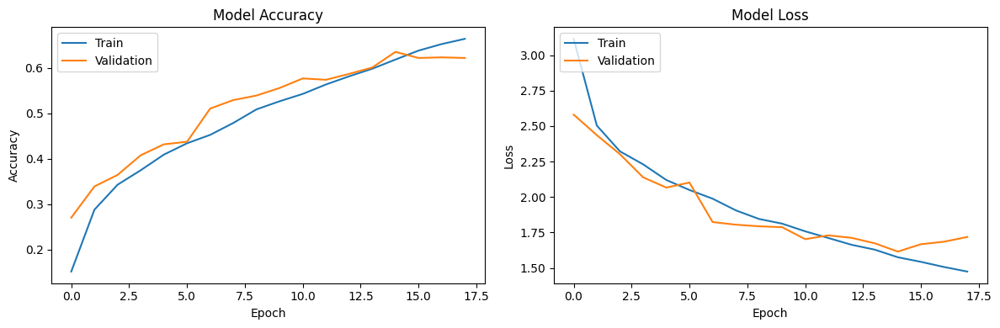

In [32]:
plot_training_history(history_1)

# Result Model 1

In [33]:
best_model_path_1 = 'best_model_1.h5'
evaluate_best_model(best_model_path_1, test_data, test_dataset)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 94, 94, 64)        1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 47, 47, 64)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 45, 45, 64)        36928     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 22, 22, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 20, 20, 640)       369280    
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 10, 10, 640)     

loss: 1.7683 - accuracy: 0.5285

In [34]:
# Obtain predictions using the best model
best_model_1 = tf.keras.models.load_model(best_model_path_1)
pred_best_model_1 = best_model_1.predict(test_dataset)
pred_best_model_1 = np.argmax(pred_best_model_1, axis=1)

24/24 [==============================] - 1s 52ms/step


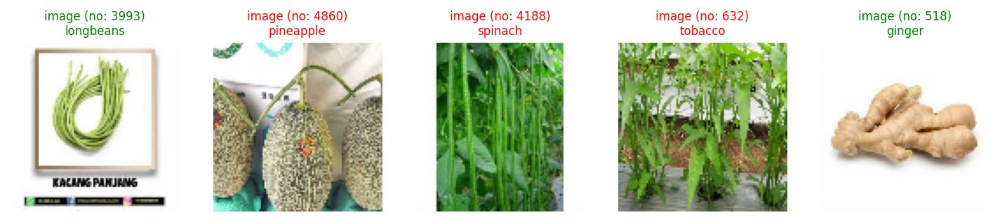

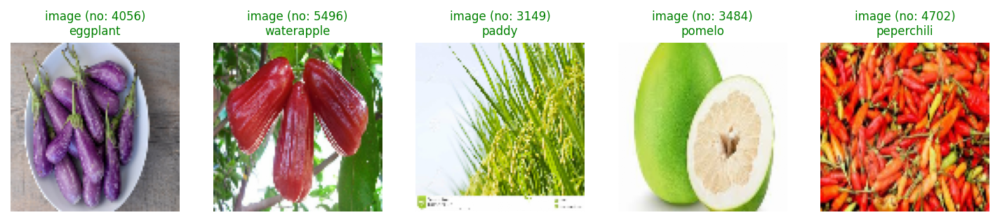

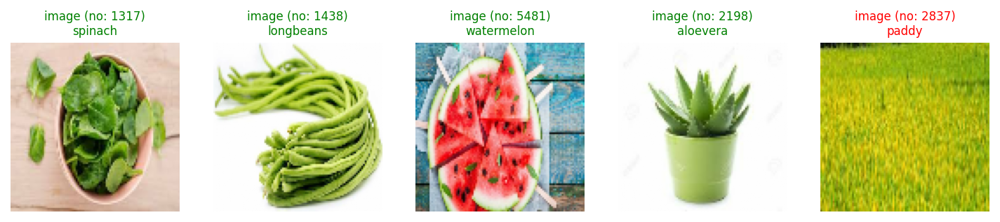

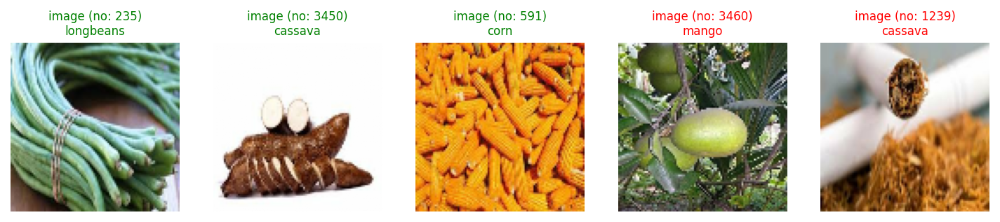

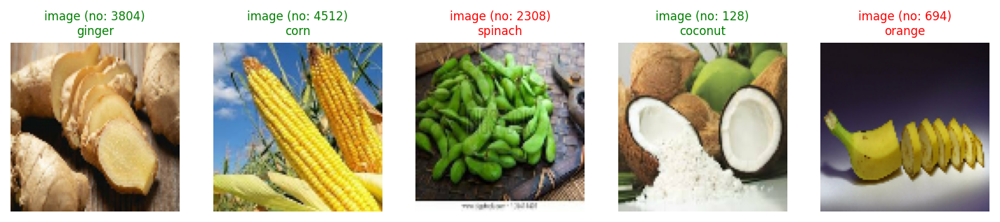

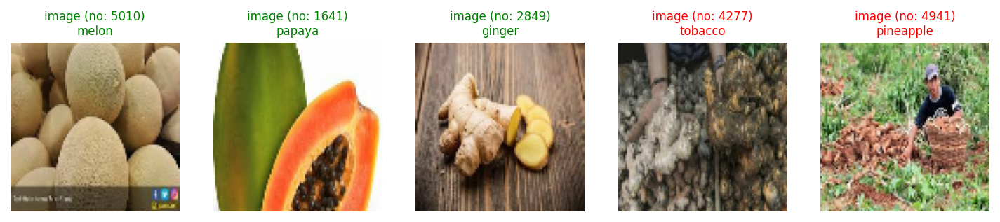

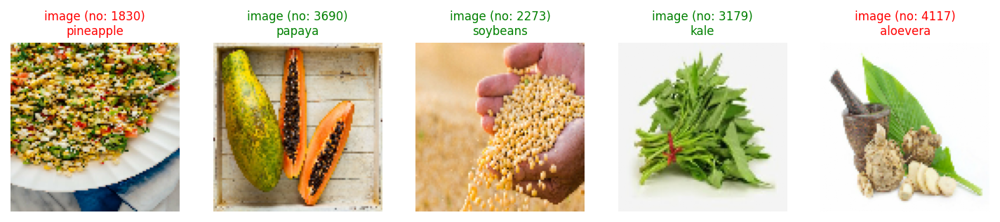

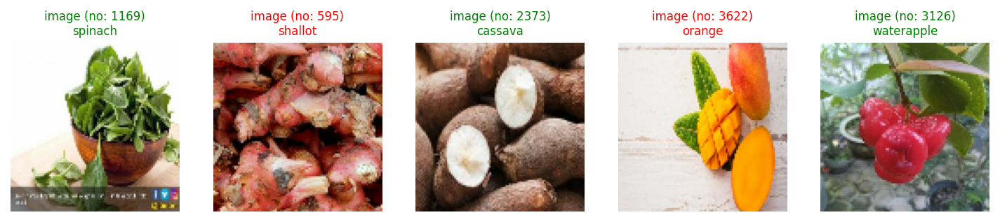

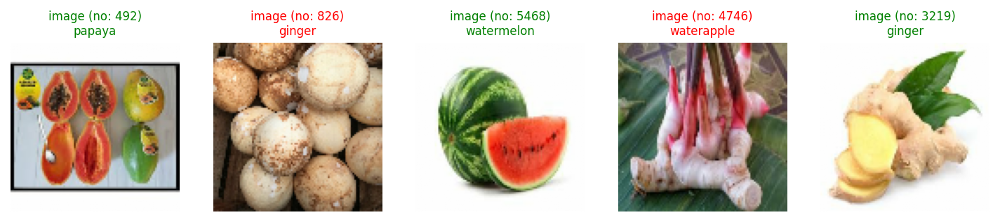

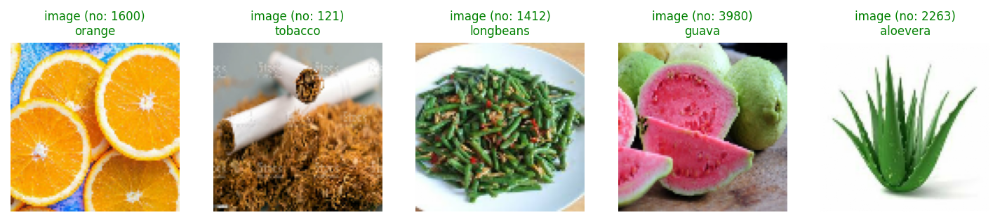

In [54]:
for i in LIST_SEED:
    random_test_sample_with_prediction_best_model(best_model_path_1, test_dataset, pred_best_model_1, BATCH_SIZE, SEED=i)

# Train model 2

In [92]:
history_2 = train_model(model_2, train_dataset, valid_dataset, name='best_model_2.h5', epochs=100)

Epoch 1/100
82/83 [============================>.] - ETA: 0s - loss: 3.2909 - accuracy: 0.5461
Epoch 1: val_accuracy improved from -inf to 0.72467, saving model to best_model_2.h5
83/83 [==============================] - 68s 789ms/step - loss: 3.2906 - accuracy: 0.5462 - val_loss: 2.4562 - val_accuracy: 0.7247
Epoch 2/100
82/83 [============================>.] - ETA: 0s - loss: 2.4606 - accuracy: 0.6774
Epoch 2: val_accuracy improved from 0.72467 to 0.74400, saving model to best_model_2.h5
83/83 [==============================] - 11s 134ms/step - loss: 2.4603 - accuracy: 0.6775 - val_loss: 2.0668 - val_accuracy: 0.7440
Epoch 3/100
82/83 [============================>.] - ETA: 0s - loss: 2.0874 - accuracy: 0.7128
Epoch 3: val_accuracy improved from 0.74400 to 0.76500, saving model to best_model_2.h5
83/83 [==============================] - 11s 134ms/step - loss: 2.0870 - accuracy: 0.7130 - val_loss: 1.8201 - val_accuracy: 0.7650
Epoch 4/100
82/83 [============================>.] - ETA: 

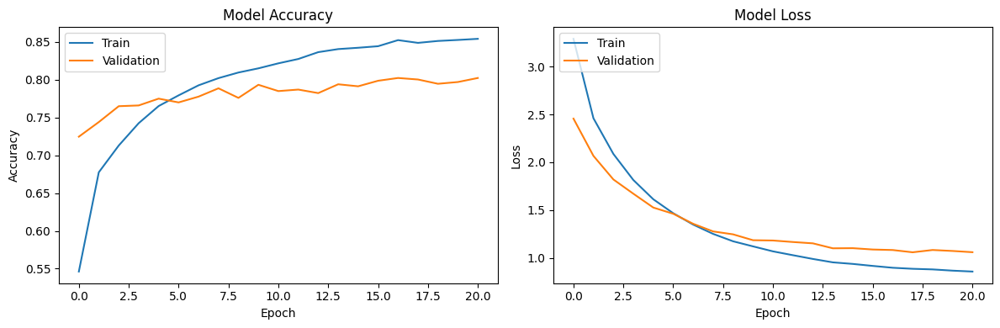

In [93]:
plot_training_history(history_2)

# Result Model 2

In [94]:
best_model_path_2 = 'best_model_2.h5'
evaluate_best_model(best_model_path_2, test_data, test_dataset)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_96 (Functi  (None, 3, 3, 1280)       2257984   
 onal)                                                           
                                                                 
 global_average_pooling2d_1   (None, 1280)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_2 (Dense)             (None, 3456)              4427136   
                                                                 
 dropout_1 (Dropout)         (None, 3456)              0         
                                                                 
 dense_3 (Dense)             (None, 30)                103710    
                                                                 
Total params: 6,788,830
Trainable params: 4,530,846
No

loss: 0.9050 - accuracy: 0.8052

In [95]:
# Obtain predictions using the best model
best_model_2 = tf.keras.models.load_model(best_model_path_2)
pred_best_model_2 = best_model_2.predict(test_dataset)
pred_best_model_2 = np.argmax(pred_best_model_2, axis=1)

24/24 [==============================] - 2s 66ms/step


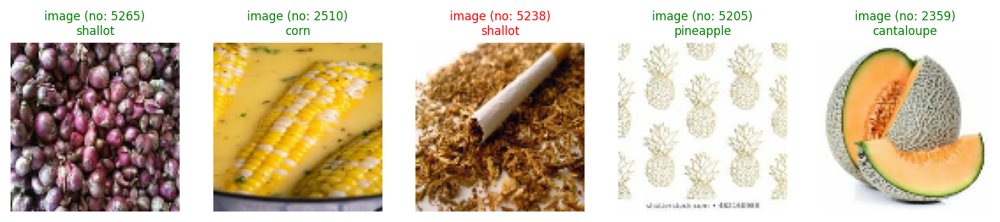

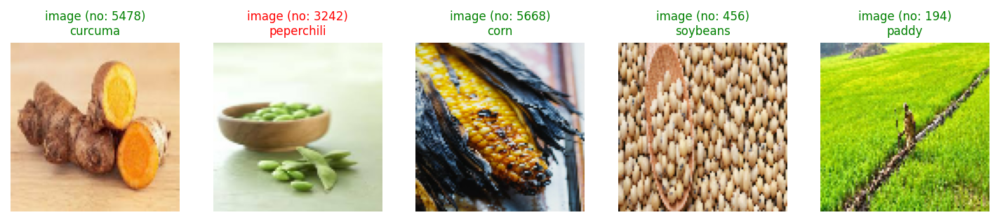

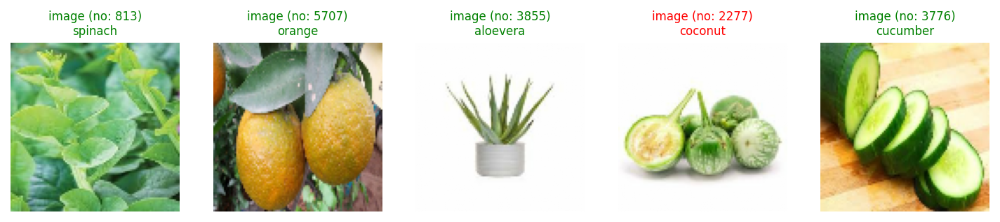

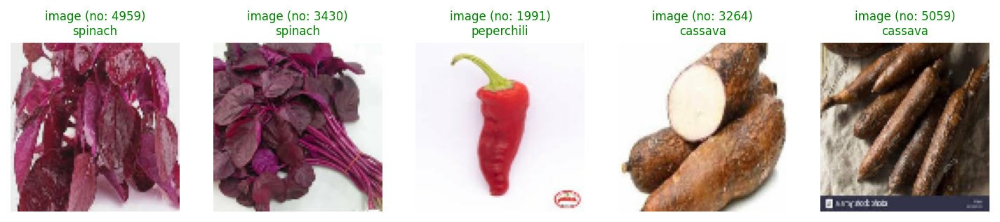

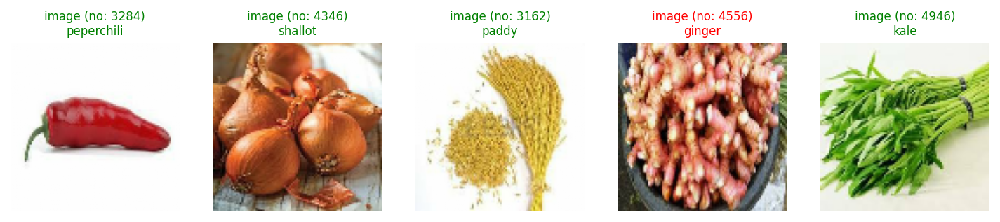

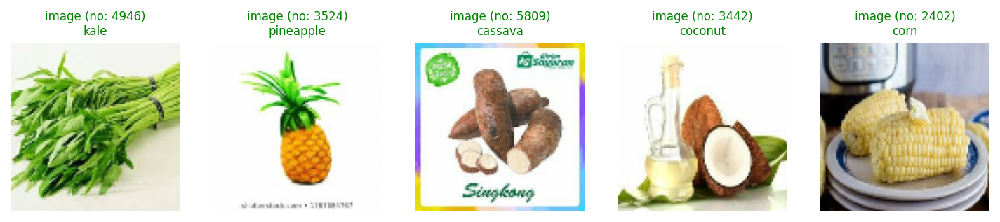

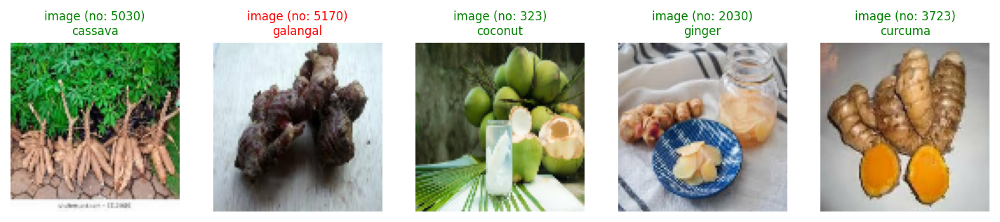

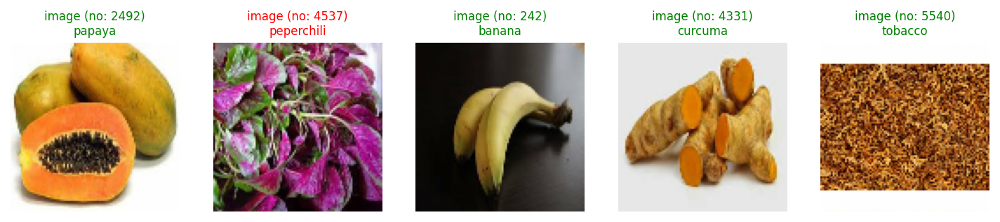

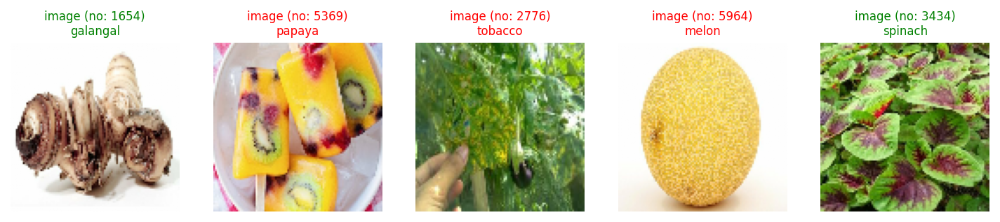

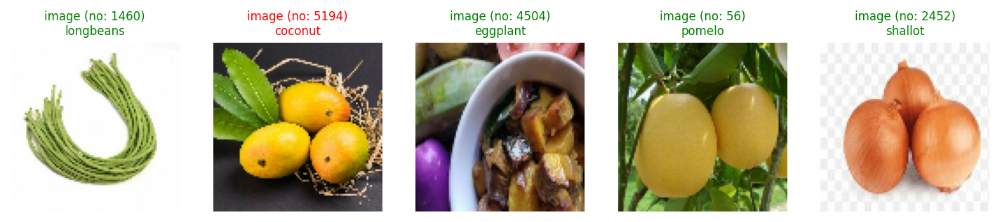

In [98]:
for i in LIST_SEED:
    random_test_sample_with_prediction_best_model(best_model_path_2, test_dataset, pred_best_model_2, BATCH_SIZE, SEED=i)

рузультаты